# 1. Airy equation

$$
{\bf u}' = \begin{bmatrix}0 & 1 \\ -t & 0 \end{bmatrix} {\bf u}
$$

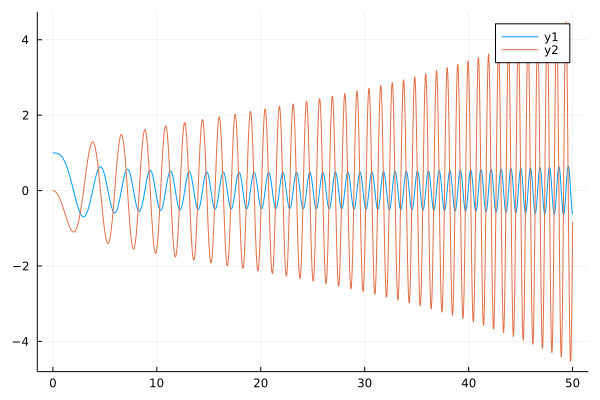

In [35]:
using LinearAlgebra, Plots, Interact

n = 50_000
t = range(0, 50; length=n)

A = t -> [0 1; -t 0]
h = step(t)

U = zeros(2,n) # each column is 𝐮_k
U[:,1] = [1,0] # initial condition

# Forward Euler:
for k = 1:n-1
    U[:,k+1] = (I + h*A(t[k])) * U[:,k]
end

# for n = 50: we see unstable for Long time (though inaccurate)

plot(t, U')

In [41]:
n = 100_000
t = range(0, 50; length=n)

A = t -> [0 1; -t 0]
h = step(t)

U = zeros(2,n) # each column is 𝐮_k
U[:,1] = [1,0] # initial condition

# Backward Euler:
for k = 1:n-1
    U[:,k+1] = (I - h*A(t[k+1])) \ U[:,k] # solve each time step
end

# for n = 50: we see stable for Long time (though inaccurate)

plot(t, U')

# 2. Heat on a Graph

$$
            {\bf u}' = \underbrace{\begin{bmatrix}-1 & 1 \\ 1 & -2 & \ddots \\ & \ddots & \ddots & 1 \\ && 1 & -2 & 1 \\ &&&1 & -1  \end{bmatrix}}_Δ {\bf u} + e_{floor(m/2)} * cos(ω*t)
$$

In [51]:
m = 50 # 50 nodes
SymTridiagonal([-1.; fill(-2, m-2); -1.], fill(1., m-1))


U = zeros(m,n) # each column is 𝐮_k
U[:,1] = zeros(m) # initial condition

𝐞 = zeros(m); 𝐞[m÷2] = 1;
ω = 1

# Forward Euler:
for k = 1:n-1
    U[:,k+1] = (I + h*Δ) * U[:,k] + h * 𝐞 * cos(ω*t[k])
end

In [56]:
# Backward Euler:
for k = 1:n-1
    U[:,k+1] = (I - h*Δ) \ (U[:,k] + h * 𝐞 * (2 + cos(ω*t[k+1])))
end

In [58]:
@manipulate for k=1:n
    scatter(U[:,k]; ylims=(-1,5), label="time = $((k-1)*h)")
end

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["k"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 100000, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 1 listeners. Value:
0, nothing), "index" => (Observable{Int64} with 2 listeners. Value:
50000, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "/Users/solver/.julia/packages/Knockout/3gjS1/src/../assets/knockout.js"), Asset("js", "knockout_punches", "/Users/solver/.julia/packages/Knockout/3gjS1/src/../assets/knockout_punches.js"), Asset("js", nothing, "/Users/solver/.julia/packages/InteractBase/o1I6G/src/../assets/all.js"), Asset("css", nothing, "/Users/solver/.julia/packages/InteractBase/o1I6G/src/../assets/style.css"), Asset("css", nothing, "/Users/solver/.julia/packages/Interact/pVyN2/src/../assets/bulma_confined.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000000011ad8f0a0, Task (runnable) @0x000000011ad8f0a0), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"1\",\"2\",\"3\",\"4\",\"5\",\"6\",\"7\",\"8\",\"9\",\"10\",\"11\",\"12\",\"13\",\"14\",\"15\",\"16\",\"17\",\"18\",\"19\",\"20\",\"21\",\"22\",\"23\",\"24\",\"25\",\"26\",\"27\",\"28\",\"29\",\"30\",\"31\",\"32\",\"33\",\"34\",\"35\",\"36\",\"37\",\"38\",\"39\"

# 3. Pendulum

$$
{\bf u}' = \begin{bmatrix}u_2(t) \\ -\sin(u_1(t)) \end{bmatrix} 
$$

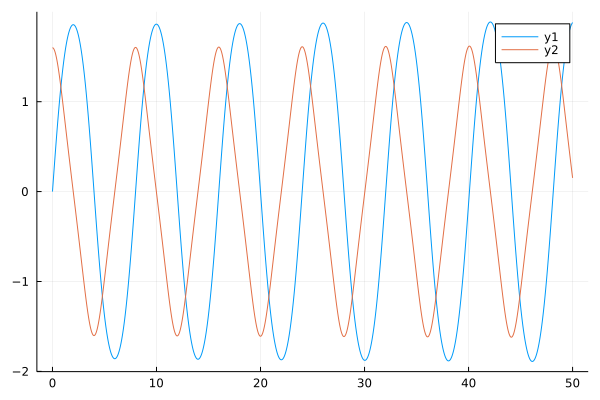

In [65]:
using LinearAlgebra, Plots, Interact

n = 50_000
t = range(0, 50; length=n)
h = step(t)

U = zeros(2,n) # each column is 𝐮_k
U[:,1] = [0,1.6] # initial condition

# Forward Euler:
for k = 1:n-1
    U[:,k+1] = U[:,k] + h * [U[2,k], -sin(U[1,k])]
end


plot(t, U')